# Lab 8: Object Detection

--------------------------------------

## Faizaan Al Faisal

--------------------------------------

Object detection is a fundamental task in computer vision that involves identifying and locating objects of interest within images or video frames. It plays a crucial role in various real-world applications, such as autonomous vehicles, video surveillance, image-based search, robotics, medical image analysis, and augmented reality. By accurately detecting and localizing objects, computer vision systems can better understand the visual world and make informed decisions based on the detected objects' positions, sizes, and relationships.

# Dataset

We will use the Vehicle-OpenImages dataset from Roboflow. The dataset contains images of various vehicles in varied traffic conditions. These images have been collected from the Open Image dataset. The images are from varied conditions and scenes. It contains 5 classes in total. They are Car, Bus, Motorcycle, Truck, Ambulance.


### Download and unzip the Dataset

For each of the train, validation, and test set folders within the dataset, you need to create two subfolders:

1. "images": This folder should contain all the images corresponding to the specific set (train, validation, or test).
2. "labels": This folder should have a ".txt" file for every image in the "images" folder. Each label file will include one line per bounding box, with the bounding box information in the YOLO format as follows:

object_class  x  y  width  height

* "object_class": This is an integer representing the object's class. Start with 0 for the first class and increment by 1 for each additional unique class in the dataset.
* "x" and "y": These values represent the normalized coordinates of the bounding box's center, with respect to the image width and height, respectively. Ensure that the coordinates are within the range of [0, 1].
* "width" and "height": These values represent the normalized width and height of the bounding box, with respect to the image width and height, respectively. Ensure that these dimensions are within the range of [0, 1].

In [1]:
!gdown https://drive.google.com/file/d/16BZkCbPQNUwTEOYXsA2cPavUPQys0Acr/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=16BZkCbPQNUwTEOYXsA2cPavUPQys0Acr
To: /content/Vehicles-OpenImages.zip
100% 40.3M/40.3M [00:00<00:00, 139MB/s]


In [2]:
!unzip /content/Vehicles-OpenImages.zip -d ./vehicles

Archive:  /content/Vehicles-OpenImages.zip
 extracting: ./vehicles/README.dataset.txt  
 extracting: ./vehicles/README.roboflow.txt  
 extracting: ./vehicles/data.yaml    
   creating: ./vehicles/test/
   creating: ./vehicles/test/images/
 extracting: ./vehicles/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg  
 extracting: ./vehicles/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg  
 extracting: ./vehicles/test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg  
 extracting: ./vehicles/test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg  
 extracting: ./vehicles/test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg  
 extracting: ./vehicles/test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg  
 extracting: ./vehicles/test/images/10c26c6598677a1f_jpg.rf.USCbBYVcUICkLhuq07Lw.jpg  
 extracting: ./vehicles/test/images/10c26c6598677a1f_jpg.rf.f72b2b91e750909f68fffeee777e9350.jpg  
 extracting: ./ve

# Annotation
In order to annotate your own dataset use the labelimg tool

# YOLOv5

Clone the YOLOv5 Repository

In [3]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16036, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 16036 (delta 40), reused 44 (delta 25), pack-reused 15967
Receiving objects: 100% (16036/16036), 14.67 MiB | 17.23 MiB/s, done.
Resolving deltas: 100% (11002/11002), done.


Install dependency from requirements.txt file

In [4]:
!pip install -r yolov5/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.8/644.8 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.4 MB/s eta 0:00:00


## Training Options
* img        : Size of image. The image is a square one. The original image is resized while maintaining the aspect ratio. The longer side of the image is resized to this number. The shorter side is padded with grey color.

* batch: The batch size

* epochs: Number of epochs to train for

* data: Data YAML file that contains information about the
dataset (path of images, labels)

* workers: Number of CPU workers

* cfg: Model architecture. There are 4 choices available: yolo5s.yaml, yolov5m.yaml, yolov5l.yaml, yolov5x.yaml. The size and complexity of these models increases in the ascending order and you can choose a model which suits the complexity of your object detection task. In case you want to work with a custom architecture, you will have to define a YAML file in the models folder specifying the network architecture.

* weights: Pretrained weights you want to start training from. If you want to train from scratch, use --weights ' '

* name: Various things about training such as train logs. Training weights would be stored in a folder named runs/train/name

* hyp: YAML file that describes hyperparameter choices. For examples of how to define hyperparameters, see data/hyp.scratch.yaml. If unspecified, the file data/hyp.scratch.yaml is used.

## Data Config File

* Details for the dataset you want to train your model on are defined by the data config YAML file. The following parameters have to be defined in a data config file:

* train, test, and val: Locations of train, test, and validation images.

* nc: Number of classes in the dataset.

* names: Names of the classes in the dataset. The index of the
classes in this list would be used as an identifier for the class names in the code.

## Hyperparameter Config File
The hyperparameter config file helps us define the hyperparameters for our neural network. We are going to use the default one, data/hyp.scratch.yaml. This is what it looks like.

## Custom Network Architecture
YOLO v5 also allows you to define your own custom architecture and anchors if one of the pre-defined networks doesn't fit the bill for you. For this you will have to define a custom weights config file. For this example, we use the the yolov5s.yaml. This is what it looks like.

## Train Model from pretrained model
The models range from nano to large as follows:


*   yolov5n
*   yolov5s
* yolov5m
* yolov5l



In [34]:
import os
print("Total Training Images: ", len(os.listdir('/content/vehicles/train/images')))
print("Total Validation Images: ", len(os.listdir('/content/vehicles/valid/images')))
print("Total Testing Images: ", len(os.listdir('/content/vehicles/test/images')))

Total Training Images:  878
Total Validation Images:  250
Total Testing Images:  126


### Important Note
Please provide absolute paths for train and validation datasets in "data.yaml" file of you dataset.

To train the model we use the "train.py" file and provide various arguments listed above.

In [11]:
!python /content/yolov5/train.py --img 800  --batch 32 --epochs 15 --data /content/vehicles/data.yaml --weights 'yolov5s.pt' --name vehicles

2023-11-02 18:56:36.973069: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-02 18:56:36.973136: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-02 18:56:36.973185: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/vehicles/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=32, imgsz=800, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=Fal

## Perform validation on test/val set

To validate your model on the test set change the path of the "val" in your "data.yaml" file to the test set directory. If you want to validate it on validation set again, keep the validation path against the "val" variable.

In [36]:
!python /content/yolov5/val.py --img 800  --batch 32 --data /content/vehicles/data.yaml --weights '/content/yolov5/runs/train/vehicles/weights/best.pt' --name vehicles

val: data=/content/vehicles/data.yaml, weights=['/content/yolov5/runs/train/vehicles/weights/best.pt'], batch_size=32, imgsz=800, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=vehicles, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-232-g1c60c53 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/vehicles/test/labels... 126 images, 0 backgrounds, 0 corrupt: 100% 126/126 [00:00<00:00, 762.13it/s]
val: New cache created: /content/vehicles/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 4/4 [00:10<00:00,  2.56s/it]
                   all        126        258      0.717      0.659      0.696       0.44
             Ambulance 

## Perform inference using trained model

To perform inference using our models, we use the "detect.py" file. By providing the source path to a folder, video or a single image, it will perform detection on all the images in the folder, or the complete video or the single image.

In [13]:
!python ./yolov5/detect.py --weights '/content/yolov5/runs/train/vehicles/weights/best.pt' --source /content/vehicles/test/images

detect: weights=['/content/yolov5/runs/train/vehicles/weights/best.pt'], source=/content/vehicles/test/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-232-g1c60c53 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/126 /content/vehicles/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 640x640 1 Ambulance, 11.5ms
image 2/126 /content/vehicles/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 640x640 1 Ambulance, 11.5ms
image 3/126 /content/vehicles/tes

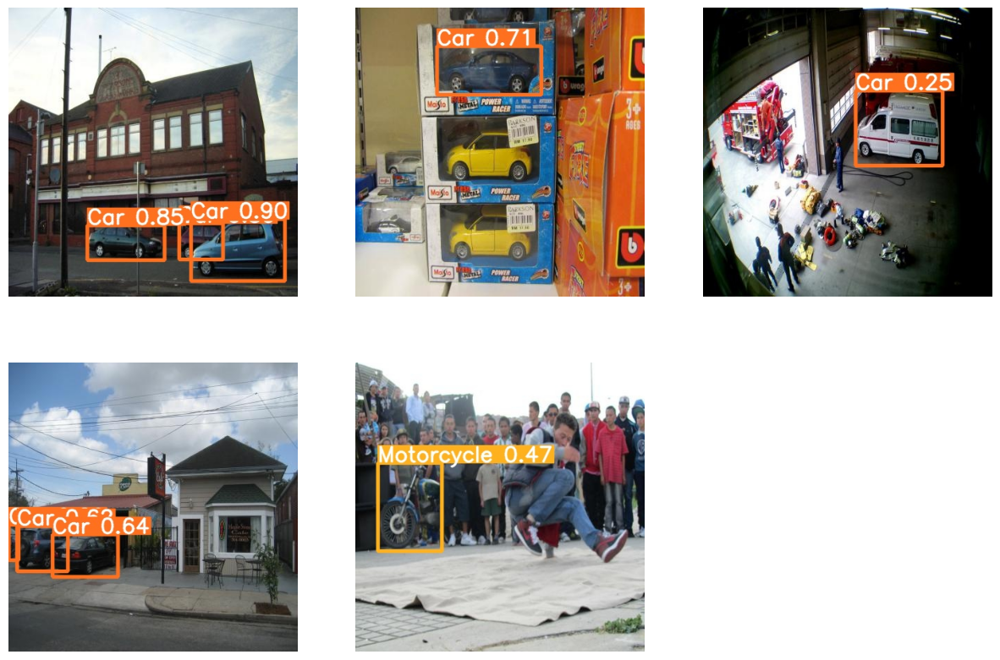

In [20]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#### function to display random images using matplot
def display_imgs(directory, num_images=5, images_row=3):
    image_files = [f for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]
    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    rows = (len(selected_images) - 1) // images_row + 1
    plt.figure(figsize=(15, 5 * rows))
    for i, image_file in enumerate(selected_images):
        plt.subplot(rows, images_row, i + 1)
        img_path = os.path.join(directory, image_file)
        img = mpimg.imread(img_path)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

display_imgs('/content/yolov5/runs/detect/exp', num_images=5)

# YOLOv8

YOLOv8 is available in the form of a python package for ease of use. You can use tensorboard with each of the YOLO models given in this repo. You just have to provide the path of the specific directory containing the training experiments. In the cell below, before starting training we create the experiment directories ourselves so that we can start tensorboard before starting the model training for tracking model learning in real time

In [21]:
!mkdir runs2
!mkdir runs2/detect

In [23]:
import tensorboard
%load_ext tensorboard
%tensorboard --logdir /content/runs/detect
# Don't worry if tensor board is not working for your. You may ignore this error and move on to the next cells.

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10115), started 0:00:12 ago. (Use '!kill 10115' to kill it.)

<IPython.core.display.Javascript object>

In [24]:
# This is the ultralytics library for using Ultralytics' various tools for object detection.
!pip install ultralytics

## Train YOLOv8 Model
The YOLOv8 can be trained, validated and used for inferenced by either using the CLI or its python API.

1. Start model training of nano model from scratch using command line:

In [26]:
!yolo task=detect mode=train model=yolov8s.yaml imgsz=800 data=/content/vehicles/data.yaml epochs=10 batch=16 name=yolov8s_scratch


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

2. Start training by using the "ultralytics" package in python.

In [27]:
from ultralytics import YOLO
# Load the model.
model = YOLO('yolov8s.pt') # yolo v8 small

# Training.
results = model.train(
   data='/content/vehicles/data.yaml',
   imgsz=800,
   epochs=15,
   batch=32,
   name='vehicles_pretrained')

100%|██████████| 21.5M/21.5M [00:00<00:00, 207MB/s]
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/vehicles/data.yaml, epochs=15, patience=50, batch=32, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=vehicles_pretrained, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, re

## Validate YOLOv8 Model
Validate the model on val/test. You need to change the path for the "val" variable to the test set in the "data.yaml" file

In [35]:
# Load the model.
model = YOLO('/content/runs/detect/vehicles_pretrained/weights/best.pt')

# validating.
results = model.val(
   data='/content/vehicles/data.yaml',
   imgsz=800,
   epochs=1,
   batch=32,
   name='vehicles_yolov8')

Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/vehicles/test/labels... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<00:00, 900.29it/s]
val: New cache created: /content/vehicles/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.18s/it]
                   all        126        258      0.807      0.576      0.685      0.456
             Ambulance        126         18       0.86          1      0.929      0.856
                   Bus        126         38       0.72      0.737      0.774      0.449
                   Car        126        150      0.745      0.547      0.647      0.403
            Motorcycle        126         32      0.711      0.461       0.61      0.219
                 Truck        126         20          

## Perform Inference Using YOLOv8
We use CLI for inferencing on the images in the test set

In [ ]:
!yolo predict model=/content/yolov8s.pt source='/content/vehicles/test/images'

You can also use the python code for this but it will return the predictions as a list.

In [38]:
model = YOLO('/content/runs/detect/vehicles_pretrained/weights/best.pt')
results = model.predict(source='/content/vehicles/test/images', save=True)


image 1/126 /content/vehicles/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 800x800 1 Ambulance, 24.9ms
image 2/126 /content/vehicles/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 800x800 1 Ambulance, 24.9ms
image 3/126 /content/vehicles/test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg: 800x800 3 Buss, 24.7ms
image 4/126 /content/vehicles/test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg: 800x800 3 Buss, 24.8ms
image 5/126 /content/vehicles/test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg: 800x800 2 Buss, 24.7ms
image 6/126 /content/vehicles/test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg: 800x800 2 Buss, 24.8ms
image 7/126 /content/vehicles/test/images/10c26c6598677a1f_jpg.rf.USCbBYVcUICkLhuq07Lw.jpg: 800x800 1 Motorcycle, 24.8ms
image 8/126 /content/vehicles/test/images/10c26c6598677a1f_jpg.rf.f72b2b91e750909f68fffeee777e9350.jpg: 800x800 1 Motorcycle, 18.0ms
image 9/1

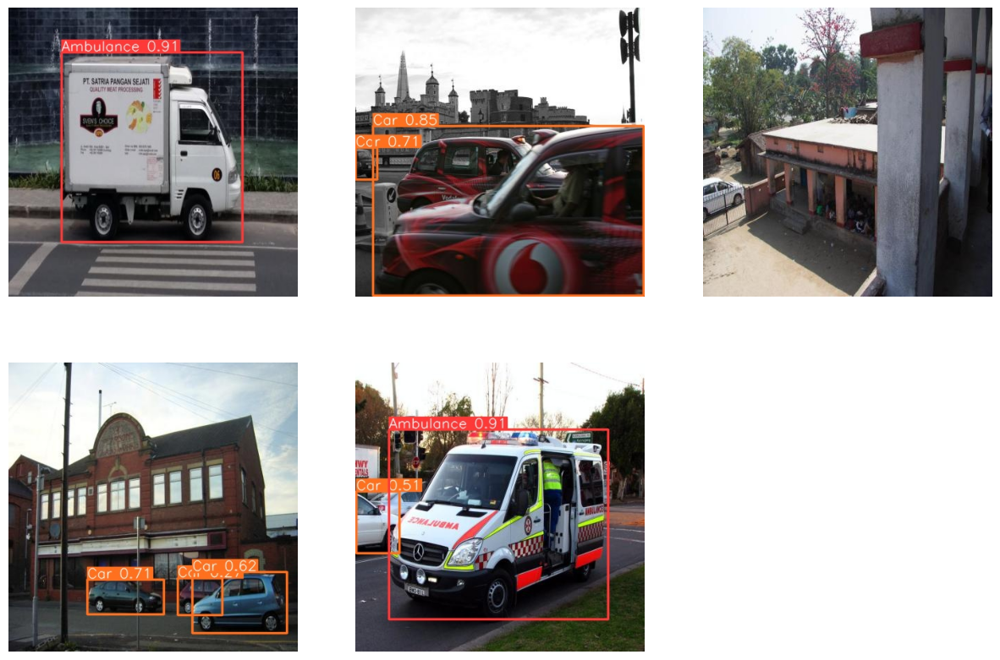

In [41]:
display_imgs('/content/runs/detect/predict', num_images=5)

# Tasks:


1.   Please fully train the YOLOv5s (small) and YOLOv8s (small) models on the provided dataset
2.   Evaluate your models on the test sets and provide the mAP values.
3.   Prepare a report in which you compare the performance of both the models. Please study the architectures of both YOLOV5 and YOLOV8 and illustrate these in your report.
4. In your report, discuss which model is performing better on the test set and what can be the reason? If YOLOV8 is performing better, then what are the innovations that allow YOLOV8 to perform better than YOLOV5.
5. Show predictions of both models on 4-5 test images in the report and compare them side by side.  



# Source

https://github.com/Vision-At-SEECS/Pytorch_Labs/blob/main/Lab5_CV_Object_Detection.ipynb

Prepared by: Bostan Khan, Team Lead, Machine Vision and Intelligent Systems Lab